# Machine Learning - Randomized Optimization - Optimal Weight

## 1. Import Modules

In [1]:
# Basic Modules
import numpy as np
import matplotlib.pyplot as plt
import time

# Data Related Modules
import pandas as pd

# Data Processing
from sklearn.preprocessing import LabelEncoder

# Data Processing - Splitting Test / Train Data
from sklearn.model_selection import train_test_split

# Decision Tree
from sklearn.tree import DecisionTreeClassifier

# MLP Neural Network
from sklearn.neural_network import MLPClassifier

# AdaBoost
from sklearn.ensemble import AdaBoostClassifier

# SVM
from sklearn.svm import SVC

# KNN
from sklearn.neighbors import KNeighborsClassifier

# Validating the Model
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc

# Optimization
from sklearn.model_selection import cross_validate
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve, validation_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Randomized Optimization
import six
import sys
sys.modules['sklearn.externals.six'] = six
import mlrose

## 2. Import Data

In [2]:
# Grab the data and convert csv to pandas dataframe.
cancer_df = pd.read_csv("wdbc.csv")
cancer_df.head()

,idnumber,diagnosis,radius,texture,perimeter,area,smoothness,compactness,concavity,concavepoints,...,radiusworst,textureworst,perimeterworst,areaworst,smoothnessworst,compactnessworst,concavityworst,concavepointsworst,symmetryworst,fractaldimensionworst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
# See how many columns and row is in the dataframe
cancer_df.shape

(569, 32)

In [4]:
# See the column names
cancer_df.keys()

Index(['idnumber', 'diagnosis', 'radius', 'texture', 'perimeter', 'area',
       'smoothness', 'compactness', 'concavity', 'concavepoints', 'symmetry',
       'fractaldimension', 'radiusse', 'texturese', 'perimeterse', 'arease',
       'smoothnessse', 'compactnessse', 'concavityse', 'concavepointsse',
       'symmetryse', 'fractaldimensionse', 'radiusworst', 'textureworst',
       'perimeterworst', 'areaworst', 'smoothnessworst', 'compactnessworst',
       'concavityworst', 'concavepointsworst', 'symmetryworst',
       'fractaldimensionworst'],
      dtype='object')

In [5]:
# Remove unnecessary columns for the better dataframe. (Diagnosis in this case will be considered as a target (y))
X = cancer_df.drop(['idnumber','diagnosis'], axis=1)
X.head()

,radius,texture,perimeter,area,smoothness,compactness,concavity,concavepoints,symmetry,fractaldimension,...,radiusworst,textureworst,perimeterworst,areaworst,smoothnessworst,compactnessworst,concavityworst,concavepointsworst,symmetryworst,fractaldimensionworst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
# Set diagnosis  as a target(y) and transform the letters into integer value
y = cancer_df.diagnosis
y = LabelEncoder().fit_transform(y)

# There are 357 benign and 212 malignant cases  in the database
np.bincount(y)

array([357, 212], dtype=int64)

In [7]:
# Split between the test and train dataset. test size will be 40% of the whole dataset, use the random seed 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1, stratify=y)

## 3. Neural Network

In [13]:
mlp = MLPClassifier(random_state=1, max_iter=1000)
mlp.fit(X_train, y_train)

MLPClassifier(max_iter=1000, random_state=1)

In [14]:
y_pred = mlp.predict(X_test)

In [15]:
confusion_mat = pd.DataFrame(confusion_matrix(y_test, y_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],135,8
True[1],8,77


In [16]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       143
           1       0.91      0.91      0.91        85

    accuracy                           0.93       228
   macro avg       0.92      0.92      0.92       228
weighted avg       0.93      0.93      0.93       228



In [17]:
print ('Wrong Categorized Sample: %d' % (y_test != y_pred).sum())
print ('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print ('Precision: %.3f' % precision_score(y_true = y_test, y_pred = y_pred))
print ('Recall: %.3f' % recall_score(y_true = y_test, y_pred = y_pred))
print ('F1: %.3f' % f1_score(y_true = y_test, y_pred = y_pred))

Wrong Categorized Sample: 16
Accuracy: 0.930
Precision: 0.906
Recall: 0.906
F1: 0.906


In [18]:
fpr, tpr, thresholds = roc_curve(y_test, mlp.predict_proba(X_test)[:, 1])

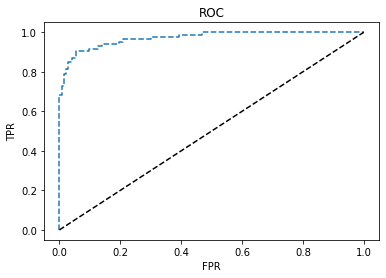

In [19]:
plt.plot(fpr, tpr, '--')
plt.plot([0,1],[0,1],'k--')
plt.plot([fpr],[tpr],'r-')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.show()

In [20]:
# Cross Validation
scores = cross_validate(estimator=mlp, X=X_train, y=y_train,scoring=['accuracy'], cv=5, n_jobs=-1, return_train_score=False)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores['test_accuracy']),np.std(scores['test_accuracy'])))

CV accuracy: 0.921 +/- 0.044


In [21]:
mlp.get_params()

{'activation': 'relu',
 'alpha': 0.0001,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (100,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.001,
 'max_fun': 15000,
 'max_iter': 1000,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': 1,
 'shuffle': True,
 'solver': 'adam',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': False,
 'warm_start': False}

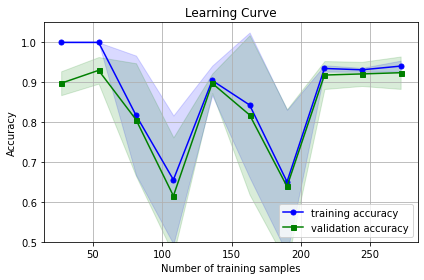

In [22]:
train_sizes, train_scores, test_scores = learning_curve(estimator=mlp, X=X_train, y=y_train, train_sizes=np.linspace(0.1,1.0,10), cv=5, n_jobs=-1)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.plot(train_sizes, train_mean, color='blue', marker='o',markersize=5, label='training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std,alpha=0.15,color='blue')
plt.plot(train_sizes, test_mean, color='green', marker='s',markersize=5, label='validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std,alpha=0.15,color='green')

plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.ylim([0.5, 1.05])
plt.tight_layout()
plt.show()

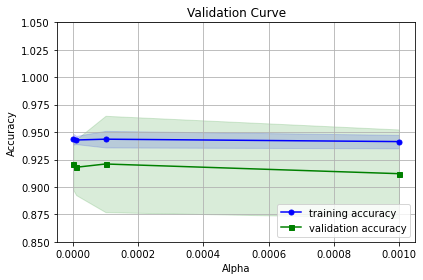

In [23]:
# Validation Curve

param_range=[1e-06, 1e-05, 0.0001, 0.001]

train_scores, test_scores = validation_curve(estimator=mlp, X=X_train, y=y_train, param_name='alpha',param_range=param_range, cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.plot(param_range, train_mean, color='blue', marker='o',markersize=5, label='training accuracy')
plt.fill_between(param_range, train_mean + train_std, train_mean - train_std,alpha=0.15,color='blue')
plt.plot(param_range, test_mean, color='green', marker='s',markersize=5,label='validation accuracy')
plt.fill_between(param_range, test_mean + test_std, test_mean - test_std,alpha=0.15,color='green')

plt.grid()
plt.xlabel('Alpha')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Validation Curve')
plt.ylim([0.85, 1.05])
plt.tight_layout()
plt.show()

In [24]:
# Hyperparameter Tuning
param_range1=[(5,5),(5,10),(10,5),(10,10)]
param_range2=[1e-06, 1e-05, 0.0001, 0.001]

param_grid = [{'hidden_layer_sizes': param_range1, 'alpha': param_range2}]

gs = GridSearchCV(estimator=mlp, param_grid=param_grid, scoring = 'accuracy', cv=5, n_jobs=-1)

t1 = time.time()
gs = gs.fit(X_train, y_train)
t2 = time.time()
t3 = t2 - t1

print('Training Time: %.3f' % t3)
print('Best Score: %.3f' % gs.best_score_)
print('Best Parameter:', gs.best_params_)

Training Time: 3.141
Best Score: 0.930
Best Parameter: {'alpha': 0.001, 'hidden_layer_sizes': (10, 5)}


In [25]:
# Verifying Optimal Model
best_mlp = gs.best_estimator_
best_mlp.fit(X_train, y_train)

MLPClassifier(alpha=0.001, hidden_layer_sizes=(10, 5), max_iter=1000,
              random_state=1)

In [26]:
# Predicting with the verification data
y_pred = best_mlp.predict(X_test)

In [27]:
# Confusion matrix qualification
confusion_mat2 = pd.DataFrame(confusion_matrix(y_test, y_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat2

,Predict[0],Predict[1]
True[0],137,6
True[1],10,75


In [28]:
# Classification report
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94       143
           1       0.93      0.88      0.90        85

    accuracy                           0.93       228
   macro avg       0.93      0.92      0.92       228
weighted avg       0.93      0.93      0.93       228



In [29]:
print ('Wrong Categorized Sample: %d' % (y_test != y_pred).sum())
print ('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print ('Precision: %.3f' % precision_score(y_true = y_test, y_pred = y_pred))
print ('Recall: %.3f' % recall_score(y_true = y_test, y_pred = y_pred))
print ('F1: %.3f' % f1_score(y_true = y_test, y_pred = y_pred))

Wrong Categorized Sample: 16
Accuracy: 0.930
Precision: 0.926
Recall: 0.882
F1: 0.904


In [30]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, mlp.predict_proba(X_test)[:, 1])

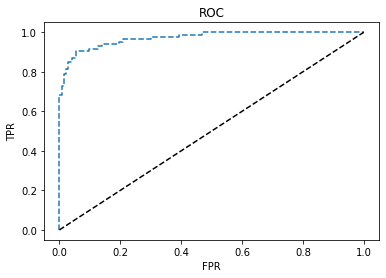

In [31]:
plt.plot(fpr, tpr, '--')
plt.plot([0,1],[0,1],'k--')
plt.plot([fpr],[tpr],'r-')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.show()

In [32]:
# Cross Validation
scores = cross_validate(estimator=best_mlp, X=X_train, y=y_train,scoring=['accuracy'], cv=5, n_jobs=-1, return_train_score=False)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores['test_accuracy']),np.std(scores['test_accuracy'])))

CV accuracy: 0.930 +/- 0.021


## 4. Random Hill Climbing

### 4.1 RHC with default parameters

In [38]:
rhc = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='random_hill_climb', 
    max_iters=100, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.GeomDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

rhc.fit(X_train, y_train)

NeuralNetwork(hidden_nodes=[],
              schedule=<mlrose.decay.GeomDecay object at 0x0000026CE465ED30>)

In [39]:
y_train_pred = rhc.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_train, y_train_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],198,16
True[1],20,107


In [40]:
print (classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       214
           1       0.87      0.84      0.86       127

    accuracy                           0.89       341
   macro avg       0.89      0.88      0.89       341
weighted avg       0.89      0.89      0.89       341



In [41]:
y_test_pred = rhc.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_test, y_test_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],129,14
True[1],13,72


In [42]:
print (classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.91      0.90      0.91       143
           1       0.84      0.85      0.84        85

    accuracy                           0.88       228
   macro avg       0.87      0.87      0.87       228
weighted avg       0.88      0.88      0.88       228



### 4.2 RHC hyper-parameters Max Iteration

Training accuracy:  0.8856304985337243
Test accuracy:  0.881578947368421

Training accuracy:  0.8944281524926686
Test accuracy:  0.881578947368421

Training accuracy:  0.906158357771261
Test accuracy:  0.8947368421052632

Training accuracy:  0.9413489736070382
Test accuracy:  0.9078947368421053



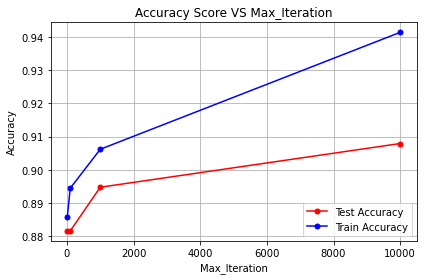

In [43]:
rhc_accuracy_test_one = []
rhc_accuracy_train_one = []
rhc_iteration_one = []

for i in (10,100,1000,10000):
    rhc = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='random_hill_climb', 
        max_iters=i, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=10, 
        random_state=1, 
        curve=True)
    
    rhc_iteration_one.append(i)
    rhc.fit(X_train, y_train)
    y_train_pred = rhc.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    rhc_accuracy_train_one.append(y_train_accuracy)
    y_test_pred = rhc.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    rhc_accuracy_test_one.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(rhc_iteration_one, rhc_accuracy_test_one, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(rhc_iteration_one, rhc_accuracy_train_one, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Iteration')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Iteration')
plt.tight_layout()
plt.show()

### 4.3 RHC hyper-parameters Max Attempt

Training accuracy:  0.9413489736070382
Test accuracy:  0.9078947368421053

Training accuracy:  0.9413489736070382
Test accuracy:  0.9078947368421053

Training accuracy:  0.9413489736070382
Test accuracy:  0.9078947368421053

Training accuracy:  0.9413489736070382
Test accuracy:  0.9078947368421053



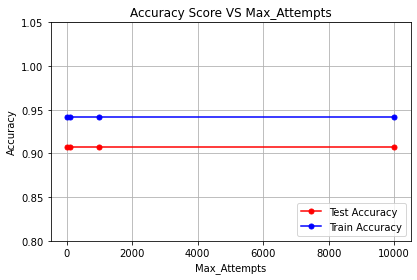

In [44]:
rhc_accuracy_test_two = []
rhc_accuracy_train_two = []
rhc_iteration_two = []

for i in (10,100,1000,10000):
    rhc = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='random_hill_climb', 
        max_iters=10000, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=i, 
        random_state=1, 
        curve=True)

    rhc_iteration_two.append(i)
    rhc.fit(X_train, y_train)
    y_train_pred = rhc.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    rhc_accuracy_train_two.append(y_train_accuracy)
    y_test_pred = rhc.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    rhc_accuracy_test_two.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(rhc_iteration_two, rhc_accuracy_test_two, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(rhc_iteration_two, rhc_accuracy_train_two, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Attempts')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Attempts')
plt.tight_layout()
plt.ylim([0.8, 1.05])
plt.show()

In [45]:
rhc = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='random_hill_climb', 
    max_iters=10000, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.GeomDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

rhc.fit(X_train, y_train)

NeuralNetwork(hidden_nodes=[], max_iters=10000,
              schedule=<mlrose.decay.GeomDecay object at 0x0000026CE471D7C0>)

In [48]:
y_test_pred = rhc.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_test, y_test_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],130,13
True[1],8,77


In [49]:
print (classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.94      0.91      0.93       143
           1       0.86      0.91      0.88        85

    accuracy                           0.91       228
   macro avg       0.90      0.91      0.90       228
weighted avg       0.91      0.91      0.91       228



## 5. Simulated Annealing

### 5.1 SA with default parameters

In [50]:
sa = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='simulated_annealing', 
    max_iters=100, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.GeomDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

sa.fit(X_train, y_train)

NeuralNetwork(hidden_nodes=[],
              schedule=<mlrose.decay.GeomDecay object at 0x0000026CE4675AC0>)

In [51]:
y_train_pred = sa.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_train, y_train_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],207,7
True[1],24,103


In [52]:
print (classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       214
           1       0.94      0.81      0.87       127

    accuracy                           0.91       341
   macro avg       0.92      0.89      0.90       341
weighted avg       0.91      0.91      0.91       341



In [53]:
y_test_pred = sa.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_test, y_test_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

,Predict[0],Predict[1]
True[0],133,10
True[1],20,65


In [54]:
print (classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90       143
           1       0.87      0.76      0.81        85

    accuracy                           0.87       228
   macro avg       0.87      0.85      0.86       228
weighted avg       0.87      0.87      0.87       228



### 5.2 SA hyper-parameters Max Iteration

Training accuracy:  0.8856304985337243
Test accuracy:  0.8771929824561403

Training accuracy:  0.9090909090909091
Test accuracy:  0.868421052631579

Training accuracy:  0.8914956011730205
Test accuracy:  0.881578947368421

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053



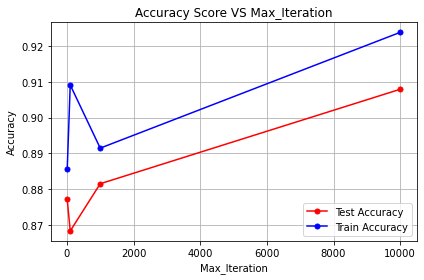

In [55]:
sa_accuracy_test_one = []
sa_accuracy_train_one = []
sa_iteration_one = []

for i in (10,100,1000,10000):
    sa = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='simulated_annealing', 
        max_iters=i, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=10, 
        random_state=1, 
        curve=True)
    
    sa_iteration_one.append(i)
    sa.fit(X_train, y_train)
    y_train_pred = sa.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    sa_accuracy_train_one.append(y_train_accuracy)
    y_test_pred = sa.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    sa_accuracy_test_one.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(sa_iteration_one, sa_accuracy_test_one, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(sa_iteration_one, sa_accuracy_train_one, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Iteration')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Iteration')
plt.tight_layout()
plt.show()

### 5.3 SA hyper-parameters Max Attempt

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053



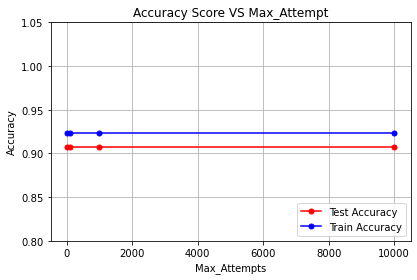

In [57]:
sa_accuracy_test_two = []
sa_accuracy_train_two = []
sa_iteration_two = []

for i in (10,100,1000,10000):
    sa = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='simulated_annealing', 
        max_iters=10000, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=i, 
        random_state=1, 
        curve=True)

    sa_iteration_two.append(i)
    sa.fit(X_train, y_train)
    y_train_pred = sa.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    sa_accuracy_train_two.append(y_train_accuracy)
    y_test_pred = sa.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    sa_accuracy_test_two.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(sa_iteration_two, sa_accuracy_test_two, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(sa_iteration_two, sa_accuracy_train_two, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Attempts')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Attempt')
plt.tight_layout()
plt.ylim([0.8, 1.05])
plt.show()

### 5.4 SA hyper-parameters Schedule

In [145]:
sa = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='simulated_annealing', 
    max_iters=10000, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.GeomDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

sa.fit(X_train, y_train)

y_train_pred = sa.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
y_test_pred = sa.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)

print('Training accuracy: ', y_train_accuracy)
print('Test accuracy: ', y_test_accuracy)
print()

Training accuracy:  0.9237536656891495
Test accuracy:  0.9078947368421053



In [146]:
sa = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='simulated_annealing', 
    max_iters=10000, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.ArithDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

sa.fit(X_train, y_train)

y_train_pred = sa.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
y_test_pred = sa.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)

print('Training accuracy: ', y_train_accuracy)
print('Test accuracy: ', y_test_accuracy)
print()

Training accuracy:  0.9208211143695014
Test accuracy:  0.9035087719298246



In [148]:
sa = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='simulated_annealing', 
    max_iters=10000, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.ExpDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

sa.fit(X_train, y_train)

y_train_pred = sa.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
y_test_pred = sa.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)

print('Training accuracy: ', y_train_accuracy)
print('Test accuracy: ', y_test_accuracy)
print()

Training accuracy:  0.9208211143695014
Test accuracy:  0.9078947368421053



## 6. Genetic Algorithm

### 6.1 GA with default parameters

In [162]:
ga = mlrose.NeuralNetwork(
    hidden_nodes=None, 
    activation='relu', 
    algorithm='genetic_alg', 
    max_iters=100, 
    bias=True, 
    is_classifier=True, 
    learning_rate=0.1, 
    early_stopping=False, 
    clip_max=10000000000.0, 
    restarts=0, 
    schedule=mlrose.GeomDecay(), 
    pop_size=200, 
    mutation_prob=0.1, 
    max_attempts=10, 
    random_state=1, 
    curve=True)

ga.fit(X_train, y_train)

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

NeuralNetwork(hidden_nodes=[],
              schedule=<mlrose.decay.GeomDecay object at 0x0000022E3CEB6280>)

In [163]:
y_train_pred = ga.predict(X_train)
y_train_accuracy = accuracy_score(y_train, y_train_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_train, y_train_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))


,Predict[0],Predict[1]
True[0],212,2
True[1],20,107


In [164]:
print (classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95       214
           1       0.98      0.84      0.91       127

    accuracy                           0.94       341
   macro avg       0.95      0.92      0.93       341
weighted avg       0.94      0.94      0.93       341



In [165]:
y_test_pred = ga.predict(X_test)
y_test_accuracy = accuracy_score(y_test, y_test_pred)
confusion_mat = pd.DataFrame(confusion_matrix(y_test, y_test_pred), index = ['True[0]', 'True[1]'], columns = ['Predict[0]', 'Predict[1]'])
confusion_mat

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))


,Predict[0],Predict[1]
True[0],139,4
True[1],24,61


In [166]:
print (classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       143
           1       0.94      0.72      0.81        85

    accuracy                           0.88       228
   macro avg       0.90      0.84      0.86       228
weighted avg       0.88      0.88      0.87       228



### 6.2  GA hyper-parameters Max Iteration

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

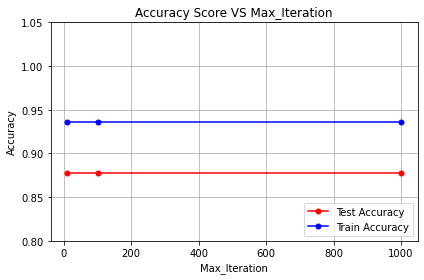

In [58]:
ga_accuracy_test_one = []
ga_accuracy_train_one = []
ga_iteration_one = []

for i in (10,100,1000):
    ga = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='genetic_alg', 
        max_iters=i, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=10, 
        random_state=1, 
        curve=True)
    
    ga_iteration_one.append(i)
    ga.fit(X_train, y_train)
    y_train_pred = ga.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    ga_accuracy_train_one.append(y_train_accuracy)
    y_test_pred = ga.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    ga_accuracy_test_one.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(ga_iteration_one, ga_accuracy_test_one, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(ga_iteration_one, ga_accuracy_train_one, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Iteration')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Iteration')
plt.ylim([0.8, 1.05])
plt.tight_layout()
plt.show()

### 6.3 GA hyper-parameters Max Attempt

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



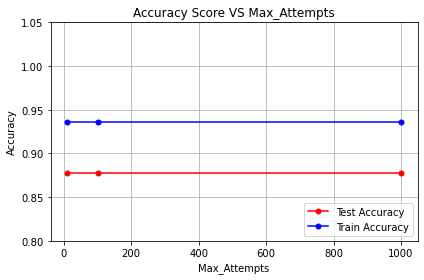

In [60]:
ga_accuracy_test_two = []
ga_accuracy_train_two = []
ga_iteration_two = []

for i in (10,100,1000):
    ga = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='genetic_alg', 
        max_iters=100, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=200, 
        mutation_prob=0.1, 
        max_attempts=i, 
        random_state=1, 
        curve=True)

    ga_iteration_two.append(i)
    ga.fit(X_train, y_train)
    y_train_pred = ga.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    ga_accuracy_train_two.append(y_train_accuracy)
    y_test_pred = ga.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    ga_accuracy_test_two.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(ga_iteration_two, ga_accuracy_test_two, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(ga_iteration_two, ga_accuracy_train_two, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Max_Attempts')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Max_Attempts')
plt.tight_layout()
plt.ylim([0.8, 1.05])
plt.show()

### 6.4 GA hyper-parameters Pop Size

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9237536656891495
Test accuracy:  0.8596491228070176



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9296187683284457
Test accuracy:  0.8859649122807017



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8947368421052632



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8771929824561403



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9325513196480938
Test accuracy:  0.868421052631579



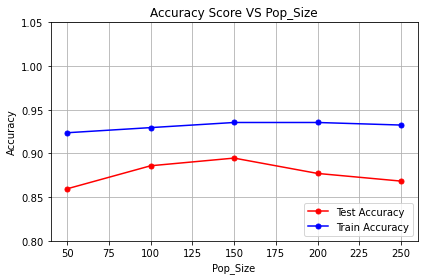

In [176]:
ga_accuracy_test_three = []
ga_accuracy_train_three = []
ga_iteration_three = []

for i in (50,100,150,200,250):
    ga = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='genetic_alg', 
        max_iters=100, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=i, 
        mutation_prob=0.1, 
        max_attempts=10, 
        random_state=1, 
        curve=True)

    ga_iteration_three.append(i)
    ga.fit(X_train, y_train)
    y_train_pred = ga.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    ga_accuracy_train_three.append(y_train_accuracy)
    y_test_pred = ga.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    ga_accuracy_test_three.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(ga_iteration_three, ga_accuracy_test_three, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(ga_iteration_three, ga_accuracy_train_three, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Pop_Size')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Pop_Size')
plt.tight_layout()
plt.ylim([0.8, 1.05])
plt.show()

### 6.5 GA hyper-parameters Mutation Prob

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9266862170087976
Test accuracy:  0.8640350877192983



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9354838709677419
Test accuracy:  0.8947368421052632



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

Training accuracy:  0.9384164222873901
Test accuracy:  0.9342105263157895



C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-packages\mlrose\activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
C:\Users\wonpe\anaconda3\lib\site-

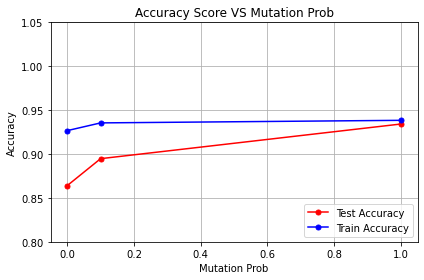

In [59]:
ga_accuracy_test_four = []
ga_accuracy_train_four = []
ga_iteration_four = []

for i in (0, 0.1, 1):
    ga = mlrose.NeuralNetwork(
        hidden_nodes=None, 
        activation='relu', 
        algorithm='genetic_alg', 
        max_iters=100, 
        bias=True, 
        is_classifier=True, 
        learning_rate=0.1, 
        early_stopping=False, 
        clip_max=10000000000.0, 
        restarts=0, 
        schedule=mlrose.GeomDecay(), 
        pop_size=150, 
        mutation_prob=i, 
        max_attempts=10, 
        random_state=1, 
        curve=True)

    ga_iteration_four.append(i)
    ga.fit(X_train, y_train)
    y_train_pred = ga.predict(X_train)
    y_train_accuracy = accuracy_score(y_train, y_train_pred)
    ga_accuracy_train_four.append(y_train_accuracy)
    y_test_pred = ga.predict(X_test)
    y_test_accuracy = accuracy_score(y_test, y_test_pred)
    ga_accuracy_test_four.append(y_test_accuracy)
    
    print('Training accuracy: ', y_train_accuracy)
    print('Test accuracy: ', y_test_accuracy)
    print()
    
plt.plot(ga_iteration_four, ga_accuracy_test_four, color='red', marker='o', markersize=5, label='Test Accuracy')
plt.plot(ga_iteration_four, ga_accuracy_train_four, color='blue', marker='o', markersize=5, label='Train Accuracy')
plt.grid()
plt.xlabel('Mutation Prob')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Score VS Mutation Prob')
plt.tight_layout()
plt.ylim([0.8, 1.05])
plt.show()